<h1 style="font-size:30px;">Finetuning YOLOV9 for Instance Segmentation on Custom Dataset</h1>

In this notebook, we will finetune the latest YOLOv9e-seg model on NulnSeg Kaggle dataset.

<img src = "https://learnopencv.com/wp-content/uploads/2024/04/Notebook-Feature-Image-YOLOv9-for-Instance-Segmentation.png" width=1000 height=500>



NulnsSeg Kaggle dataset contains more than 30k manually segmented nuclei from 31 human and mouse organs and 665 image patches extracted from H&E-stained whole slide microscopic images. 

The dataset contains tissues of various human and mouse organs.
Key human and mouse organs include the cerebellum, kidney, liver, pancreas, etc.

The dataset contains a single Nuclei class.

The dataset has `665` images in total so we will split it with an 80:20 train val split ratio.
So, the final split has `532` training and `133` validation images, respectively.


Dependencies

In [1]:
!pip install -q ultralytics pycocotools scikit-learn matplotlib 

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 749.5/749.5 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 65.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 52.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 92.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━

Imports

In [2]:
import os
import copy
import random
import json
import yaml
import glob
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from   zipfile import ZipFile
import argparse
from PIL import Image
import shutil
from IPython.display import Image
from sklearn.model_selection import train_test_split

import torch
import torch.utils.data
from torch import nn
import torchvision
from ultralytics import YOLO

from torchvision import transforms as T

from pycocotools import mask as coco_mask
from pycocotools.coco import COCO
%matplotlib inline

This function block is used to **download and unzip** the dataset in the specified directory.

In [3]:
def download_and_unzip(url, save_path, extract_dir):
    print("Downloading assets...")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)
    print("Download completed.")

    try:
        if save_path.endswith(".zip"):
            with ZipFile(save_path, 'r') as zip_ref:
                zip_ref.extractall(extract_dir)
            print("Extraction Done")
    except Exception as e:
        print(f"An error occurred: {e}")

DATASET_URL = r"https://www.dropbox.com/scl/fi/u83yuoea9hu7xhhhsgp4d/Nuclei_Instance_Seg.zip?rlkey=7tw3vs4xh7rych4yq1xizd8mh&dl=1"
DATASET_DIR = "Nuclei-Instance-Dataset"
DATASET_ZIP_PATH = os.path.join(os.getcwd(), f"{DATASET_DIR}.zip")

# Download and extract if dataset does not exist.
if not os.path.exists(DATASET_DIR):
    os.makedirs(DATASET_DIR, exist_ok=True)  # Ensure the directory exists
    download_and_unzip(DATASET_URL, DATASET_ZIP_PATH, DATASET_DIR)
    os.remove(DATASET_ZIP_PATH)  # Remove the zip file after extraction


Download completed.
Extraction Done


## Data Preparation

The dataset comes with many subdirectories. However, for our `YOLOv9` fine-tuning, we just need the raw images and labeled masks, which we will convert to the appropriate format. 

For our task, we will keep the directories with subdirectories named `‘tissue images’` , `‘mask binary without border’`, and `‘label masks modify’`.


In [4]:
def prune_subdirectories(base_dir,keep_dirs):
    #Iterate through each subdirs in base dir
    for root_dir in os.listdir(base_dir):
        root_path = os.path.join(base_dir,root_dir)
        if os.path.isdir(root_path):
          #  print(f"Processing: {root_path}")
           #List all subdirs inside the current root dir
           for sub_dir in os.listdir(root_path):
               sub_path = os.path.join(root_path, sub_dir)
               #If the subdirectory isn't in the keep list, delete it
               if os.path.isdir(sub_path) and sub_dir not in keep_dirs:
                  # print(f"Deleting: {sub_path}")
                  shutil.rmtree(sub_path)
               elif os.path.isdir(sub_path):
                  # print(f"Keeping: {sub_path}")
                  pass


base_directory = "./Nuclei-Instance-Dataset"
directories_to_keep = ['tissue images', 'mask binary witthout border', 'label masks modify']

prune_subdirectories(base_directory,directories_to_keep)



In [5]:
!sudo apt install tree

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tree is already the newest version (2.0.2-1).
0 upgraded, 0 newly installed, 0 to remove and 13 not upgraded.


In [6]:
!tree --dirsfirst -L 2  "Nuclei-Instance-Dataset"

Nuclei-Instance-Dataset
├── human bladder
│   ├── label masks modify
│   └── tissue images
├── human brain
│   ├── label masks modify
│   └── tissue images
├── human cardia
│   ├── label masks modify
│   └── tissue images
├── human cerebellum
│   ├── label masks modify
│   └── tissue images
├── human epiglottis
│   ├── label masks modify
│   └── tissue images
├── human jejunum
│   ├── label masks modify
│   └── tissue images
├── human kidney
│   ├── label masks modify
│   └── tissue images
├── human liver
│   ├── label masks modify
│   └── tissue images
├── human lung
│   ├── label masks modify
│   └── tissue images
├── human melanoma
│   ├── label masks modify
│   └── tissue images
├── human muscle
│   ├── label masks modify
│   └── tissue images
├── human oesophagus
│   ├── label masks modify
│   └── tissue images
├── human pancreas
│   ├── label masks modify
│   ├── tissue images
│   └── Thumbs.db
├── human peritoneum
│   ├── label masks modify
│   └── tissue images
├── human placen

## Convert Label Masks to Yolo Annotations

Next, let’s try to convert our annotations from binary masks to YOLO format. As an intermediate step, let’s convert them to COCO JSON format, which is easy to interpret.

The `get_image_mask_pairs( )` returns all image and mask paths from the dataset appended to a list.


Binary masks are a common way to represent object annotations in segmentation tasks. They efficiently encode the shape of objects at the pixel level. However, for tasks like visualization or calculating object properties, we need to convert these masks into polygons.
`mask_to_polygons( )` shows one such approach to extract polygons from a binary mask.

In [7]:
def get_image_mask_pairs(data_dir):
    image_paths = []
    mask_paths = []

    for root,_,files in os.walk(data_dir):
        if 'tissue images' in root:
            for file in files:
                if file.endswith('.png'):
                    image_paths.append(os.path.join(root,file))
                    mask_paths.append(os.path.join(root.replace('tissue images','label masks modify'), file.replace('.png','.tif')))
    return image_paths, mask_paths


We need to convert our tissue’s binary mask to actionable polygon points. For this, let’s use `cv2.findContours` to extract approximate polygons of the binary mask. This ensures we get a valid closed polygon with more than 4 sides and outlines around mask borders.
By using `cv2.RETR_TREE` as contour retrieval mode, we can reconstruct a hierarchical relationship between all the detected contours.

In [8]:
def mask_to_polygons(mask,epsilon=1.0):
    contours,_ = cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    polygons = []
    for contour in contours:
        if len(contour) > 2:
           poly = contour.reshape(-1).tolist()
           if len(poly) > 4: #Ensures valid polygon
              polygons.append(poly)
    return polygons

## Dataset Preparation

In `process_data( )`, we will initialize annotation and images as empty lists to which we will append all the metadata. Additionally, image ID and ann ID will have zero as initial values.

We will simultaneously iterate through the image_paths and mask_path list we got from the  `get_image_mask_pairs` utility function. For each image, we assign a unique `image_id` by incrementing with 1 after each iteration. Then, we will read our image and mask using opencv. The `cv2.IMREAD_UNCHANGED` helps to read masks, including an alpha channel if present.

For each value representing an object(ignoring background), we construct a binary mask where pixels corresponding to the current unique value are set to 255(white) to highlight the object instance. 

While all other pixels are set to 0(black) effectively isolating the object from the background. The binary mask is then passed as input to the `mask_to_polygons( )` function, which processes the mask and returns a series of polygons.


In [9]:
def process_data(image_paths, mask_paths, output_images_dir, output_labels_dir):
    annotations = []
    images = []
    image_id = 0
    ann_id = 0

    for img_path, mask_path in zip(image_paths, mask_paths):
        image_id += 1
        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
        shutil.copy(img_path, os.path.join(output_images_dir, os.path.basename(img_path)))

        # Add image to the list
        images.append({
            "id": image_id,
            "file_name": os.path.basename(img_path),
            "height": img.shape[0],
            "width": img.shape[1]
        })

        unique_values = np.unique(mask)
        for value in unique_values:
            if value == 0:  # Ignore background
                continue

            object_mask = (mask == value).astype(np.uint8) * 255
            polygons = mask_to_polygons(object_mask)

            for poly in polygons:
                ann_id += 1
                annotations.append({
                    
                    "image_id": image_id,
                    "category_id": 1,  # Only one category: Nuclei
                    "segmentation": [poly],
                   
                })

    coco_input = {
        "images": images,
        "annotations": annotations,
        "categories": [{"id": 1, "name": "Nuclei"}]
    }

    # Convert COCO-like dictionary to YOLO format
    for img_info in coco_input["images"]:
        img_id = img_info["id"]
        img_ann = [ann for ann in coco_input["annotations"] if ann["image_id"] == img_id]
        img_w, img_h = img_info["width"], img_info["height"]

        if img_ann:
            with open(os.path.join(output_labels_dir, os.path.splitext(img_info["file_name"])[0] + '.txt'), 'w') as file_object:
                for ann in img_ann:
                    current_category = ann['category_id'] - 1
                    polygon = ann['segmentation'][0]
                    normalized_polygon = [format(coord / img_w if i % 2 == 0 else coord / img_h, '.6f') for i, coord in enumerate(polygon)]
                    file_object.write(f"{current_category} " + " ".join(normalized_polygon) + "\n")



Now, for each image, a corresponding .txt annotation file is created, and we extract the ‘category_id’ and ‘polygon’ of the current object instance in a recurring loop. The polygon is then normalized relative to the current image dimensions. Thus, a set of .txt files for all images is created in the output labels dir, which will be utilized during fine-tuning.

In [10]:
def create_yaml(output_yaml_path, train_images_dir, val_images_dir, nc=1):
    # Assuming all categories are the same and there is only one class, 'Nuclei'
    names = ['Nuclei']

    # Create a dictionary with the required content
    yaml_data = {
        'names': names,
        'nc': nc,  # Number of classes
        'train': train_images_dir,
        'val': val_images_dir,
        'test': ' '

    }

    # Write the dictionary to a YAML file
    with open(output_yaml_path, 'w') as file:
        yaml.dump(yaml_data, file, default_flow_style=False)


Now, the `yolo_dataset_preparation( )` function defines all the paths and calls the required set of utility functions. To simply put, this function is responsible for extracting the polygons from the raw binary masks and converting them into YOLO format. Finally, it creates `data.yaml` file for our finetuning.

In [11]:
def yolo_dataset_preparation():
    data_dir = 'Nuclei-Instance-Dataset'
    output_dir = 'yolov9_dataset'

    # Define the paths for the images and labels for training and validation
    train_images_dir = os.path.join(output_dir, 'train', 'images')
    val_images_dir = os.path.join(output_dir, 'val', 'images')
    train_labels_dir = os.path.join(output_dir, 'train', 'labels')
    val_labels_dir = os.path.join(output_dir, 'val', 'labels')

    # Create the output directories if they do not exist
    os.makedirs(train_images_dir, exist_ok=True)
    os.makedirs(val_images_dir, exist_ok=True)
    os.makedirs(train_labels_dir, exist_ok=True)
    os.makedirs(val_labels_dir, exist_ok=True)

    # Get image and mask paths
    image_paths, mask_paths = get_image_mask_pairs(data_dir)

    # Split data into train and val
    train_img_paths, val_img_paths, train_mask_paths, val_mask_paths = train_test_split(image_paths, mask_paths, test_size=0.2, random_state=42)

    # Process and save the data in YOLO format for training and validation
    process_data(train_img_paths, train_mask_paths, train_images_dir, train_labels_dir)
    process_data(val_img_paths, val_mask_paths, val_images_dir, val_labels_dir)

    # Assume create_yaml function is defined elsewhere and set appropriate paths for the YAML file
    output_yaml_path = os.path.join(output_dir, 'data.yaml')
    train_path = os.path.join('train', 'images')
    val_path = os.path.join('val', 'images')
    create_yaml(output_yaml_path, train_path, val_path)

yolo_dataset_preparation()


## Model Configuration

In [13]:
#Instance
model = YOLO("yolov9e-seg.yaml")#build a model from YAML
model = YOLO("yolov9e-seg.pt") #Transfer the weights from a pretrained model (recommended for training)

100%|██████████| 117M/117M [00:03<00:00, 36.5MB/s] 

WARNING ⚠️ yolov9e-seg.pt appears to require 'dill', which is not in ultralytics requirements.
AutoInstall will run now for 'dill' but this feature will be removed in the future.
Recommend fixes are to train a new model using the latest 'ultralytics' package or to run a command with an official YOLOv8 model, i.e. 'yolo predict model=yolov8n.pt'
requirements: Ultralytics requirement ['dill'] not found, attempting AutoUpdate...


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.0 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 2.1s, installed 1 package: ['dill']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



**Rerun model initialisation again dill package gets updated**

In [14]:
%cat yolov9_dataset/data.yaml

names:
- Nuclei
nc: 1
test: ' '
train: train/images
val: val/images


In [15]:
with open("yolov9_dataset/data.yaml",'r') as stream:
     num_classes = str(yaml.safe_load(stream)['nc'])

## Train the Model

In [16]:
#Define a project --> Destination directory for all results
project = "yolov9_dataset/results"
#Define subdirectory for this specific training
name = "70_epochs-"


In [17]:
ABS_PATH = os.getcwd()

In [18]:
#Train the model
results = model.train(
    data = os.path.join(ABS_PATH, "yolov9_dataset/data.yaml"),
    project = project,
    name = name,
    epochs = 70,
    patience = 0 , #setting patience=0 to disable early stopping,
    batch = 4,
)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.14 torch-2.2.2 CUDA:0 (NVIDIA GeForce RTX 4090, 24217MiB)
engine/trainer: task=segment, mode=train, model=yolov9e-seg.pt, data=/v9e_workspace/yolov9_dataset/data.yaml, epochs=70, time=None, patience=0, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolov9_dataset/results, name=70_epochs-, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop

100%|██████████| 6.23M/6.23M [00:00<00:00, 102MB/s]


AMP: checks passed ✅


train: Scanning /v9e_workspace/yolov9_dataset/train/labels... 532 images, 0 backgrounds, 0 corrupt: 100%|██████████| 532/532 [00:02<00:00, 187.78it/s]


train: New cache created: /v9e_workspace/yolov9_dataset/train/labels.cache


val: Scanning /v9e_workspace/yolov9_dataset/val/labels... 133 images, 0 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<00:00, 145.56it/s]

val: New cache created: /v9e_workspace/yolov9_dataset/val/labels.cache


Plotting labels to yolov9_dataset/results/70_epochs-/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 307 weight(decay=0.0), 323 weight(decay=0.0005), 322 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolov9_dataset/results/70_epochs-
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/70      11.3G      1.848      2.852      1.397      1.454        247        640: 100%|██████████| 133/133 [00:34<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:06<00:00,  2.67it/s]

                   all        133       6958      0.168      0.477      0.117     0.0587      0.163       0.44      0.108     0.0461



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/70        13G      1.853      2.784       1.17      1.447        183        640: 100%|██████████| 133/133 [00:29<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:06<00:00,  2.83it/s]

                   all        133       6958      0.545      0.618      0.473      0.216      0.541      0.615      0.465      0.206



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/70      16.4G      1.895      2.793      1.189      1.457        217        640: 100%|██████████| 133/133 [00:28<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  2.89it/s]

                   all        133       6958      0.698        0.6      0.672      0.342      0.694      0.592      0.655      0.297



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/70      14.2G      1.849      2.763      1.208      1.434        159        640: 100%|██████████| 133/133 [00:27<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  2.95it/s]

                   all        133       6958      0.735      0.624      0.706      0.363      0.724        0.6      0.674      0.314



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/70        12G      1.811      2.702       1.13      1.396        123        640: 100%|██████████| 133/133 [00:28<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.11it/s]

                   all        133       6958      0.748      0.649      0.735      0.373      0.736      0.634       0.71      0.326



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/70      9.53G      1.733      2.588      1.059      1.375        223        640: 100%|██████████| 133/133 [00:29<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.14it/s]

                   all        133       6958      0.775      0.648      0.743      0.391      0.774      0.639      0.728      0.342



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/70      14.7G      1.696      2.529      1.022      1.352        216        640: 100%|██████████| 133/133 [00:29<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.16it/s]

                   all        133       6958      0.778      0.664      0.759      0.401      0.761      0.645      0.732      0.343



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/70      13.2G       1.77      2.642      1.076      1.382         93        640: 100%|██████████| 133/133 [00:29<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.15it/s]

                   all        133       6958      0.784       0.65      0.732      0.386      0.778      0.632      0.713      0.334



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/70      17.1G      1.728      2.556      1.021      1.371        237        640: 100%|██████████| 133/133 [00:29<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.03it/s]

                   all        133       6958      0.686       0.64      0.684      0.307      0.668      0.612      0.652      0.258



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/70      9.99G      1.763      2.586      1.018      1.365        271        640: 100%|██████████| 133/133 [00:29<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.14it/s]

                   all        133       6958      0.776      0.683      0.763      0.402      0.762      0.665      0.743      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/70      9.91G      1.718       2.52      1.025      1.363        164        640: 100%|██████████| 133/133 [00:29<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958      0.783      0.661      0.756      0.413      0.777      0.642      0.732      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/70      14.5G      1.676      2.483     0.9987      1.323        184        640: 100%|██████████| 133/133 [00:29<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  2.94it/s]

                   all        133       6958      0.794      0.689      0.781      0.417      0.779      0.676      0.756      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/70      10.2G      1.641       2.44     0.9318      1.298        162        640: 100%|██████████| 133/133 [00:29<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.26it/s]

                   all        133       6958      0.822      0.705      0.801      0.447      0.813      0.698      0.788      0.403



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/70      10.6G      1.662      2.438     0.9425       1.31        211        640: 100%|██████████| 133/133 [00:29<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.20it/s]

                   all        133       6958      0.751      0.694      0.769      0.408      0.735      0.682      0.747      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/70      14.1G      1.636      2.405      0.987      1.311        483        640: 100%|██████████| 133/133 [00:29<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.18it/s]

                   all        133       6958      0.809      0.694      0.794      0.435      0.793      0.682       0.77      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/70      13.8G       1.63      2.379      0.927      1.291        320        640: 100%|██████████| 133/133 [00:28<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.14it/s]

                   all        133       6958        0.8      0.708      0.796      0.442      0.788      0.698      0.779      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/70      10.2G      1.655      2.395     0.9514      1.305        403        640: 100%|██████████| 133/133 [00:29<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.15it/s]

                   all        133       6958       0.81      0.678      0.779       0.43      0.797      0.659      0.754      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/70      11.9G      1.605      2.373     0.9084      1.299        118        640: 100%|██████████| 133/133 [00:28<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.11it/s]

                   all        133       6958      0.802      0.715      0.801      0.437      0.795      0.697      0.781      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/70      12.6G      1.578      2.324     0.9043      1.282        423        640: 100%|██████████| 133/133 [00:28<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.19it/s]

                   all        133       6958      0.804       0.73      0.808      0.442      0.801      0.717      0.791      0.387



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/70      9.36G      1.605      2.327     0.9307      1.294        362        640: 100%|██████████| 133/133 [00:29<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958      0.804      0.732      0.818      0.452      0.804      0.718      0.805      0.398



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/70      13.8G      1.563      2.305     0.8937      1.263        323        640: 100%|██████████| 133/133 [00:28<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.19it/s]

                   all        133       6958      0.794       0.73      0.813      0.457      0.793      0.715      0.799      0.409



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/70      15.8G      1.589      2.329     0.8989      1.279        124        640: 100%|██████████| 133/133 [00:27<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958       0.82      0.712      0.811      0.447      0.805      0.698      0.788      0.387



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/70      13.9G      1.562        2.3     0.8885       1.26        177        640: 100%|██████████| 133/133 [00:27<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958      0.792      0.687       0.78      0.439       0.78      0.674      0.758      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/70      10.7G      1.588      2.293     0.9008      1.278        240        640: 100%|██████████| 133/133 [00:28<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.27it/s]


                   all        133       6958       0.81      0.726      0.811      0.451      0.801      0.706      0.787      0.392

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/70      11.8G      1.551      2.273     0.8701      1.255        204        640: 100%|██████████| 133/133 [00:26<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.07it/s]

                   all        133       6958      0.814       0.73      0.815      0.455      0.806      0.724      0.805      0.416



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/70      12.9G      1.559      2.276     0.8805      1.278         92        640: 100%|██████████| 133/133 [00:28<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.43it/s]

                   all        133       6958      0.826      0.713      0.809      0.457      0.815      0.703       0.79      0.401



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/70      11.7G      1.617      2.359     0.9079      1.294        124        640: 100%|██████████| 133/133 [00:27<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.23it/s]

                   all        133       6958      0.807      0.731      0.817      0.455        0.8      0.718      0.798      0.395



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/70      12.3G      1.565      2.299     0.8844      1.262         78        640: 100%|██████████| 133/133 [00:27<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.36it/s]

                   all        133       6958      0.823      0.717       0.81      0.465      0.809      0.705      0.792      0.406



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/70      11.5G       1.54      2.236     0.8487      1.265        143        640: 100%|██████████| 133/133 [00:26<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958      0.811      0.732      0.812       0.47      0.807       0.72      0.799      0.418



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/70      12.9G      1.541      2.253     0.8477      1.261        166        640: 100%|██████████| 133/133 [00:27<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958      0.829      0.717      0.815      0.447      0.819      0.703      0.794       0.39



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/70      10.3G      1.542      2.236     0.8552      1.248        424        640: 100%|██████████| 133/133 [00:29<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958      0.822      0.749      0.836      0.479      0.821      0.736      0.824       0.43



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/70      12.1G      1.524      2.249     0.8533      1.261        465        640: 100%|██████████| 133/133 [00:27<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.16it/s]

                   all        133       6958      0.825       0.73      0.824       0.47      0.824      0.723      0.814      0.425



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/70      14.9G      1.529      2.229     0.8438      1.238        219        640: 100%|██████████| 133/133 [00:27<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.25it/s]

                   all        133       6958      0.832      0.735      0.828      0.466      0.816      0.716      0.803      0.401



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/70      12.4G      1.507      2.186     0.8382      1.242        336        640: 100%|██████████| 133/133 [00:26<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.17it/s]

                   all        133       6958      0.821      0.744      0.832      0.467       0.81      0.719      0.806      0.401



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/70      13.2G      1.514      2.222     0.8355      1.246        520        640: 100%|██████████| 133/133 [00:27<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.25it/s]

                   all        133       6958      0.818      0.756      0.839      0.472      0.807      0.736      0.815      0.406



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/70      11.2G      1.519      2.213     0.8212      1.244        224        640: 100%|██████████| 133/133 [00:27<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.08it/s]

                   all        133       6958      0.831      0.745      0.841      0.475      0.817       0.73      0.818      0.413



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/70      13.9G      1.507      2.178     0.8217      1.224        154        640: 100%|██████████| 133/133 [00:27<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.28it/s]

                   all        133       6958      0.822      0.752       0.84      0.477      0.823      0.736      0.824      0.422



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/70      14.8G      1.479      2.169     0.8449      1.237        174        640: 100%|██████████| 133/133 [00:27<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.14it/s]

                   all        133       6958        0.8      0.754       0.83      0.464      0.791      0.747      0.815      0.417



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/70      11.7G      1.497      2.177     0.8189       1.25        236        640: 100%|██████████| 133/133 [00:27<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.37it/s]

                   all        133       6958      0.822      0.744      0.837      0.479      0.823      0.727      0.819       0.42



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/70      11.3G      1.498      2.177     0.8184      1.227        487        640: 100%|██████████| 133/133 [00:27<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.26it/s]

                   all        133       6958      0.813      0.746      0.829      0.474       0.81      0.736      0.815       0.42



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/70      10.8G      1.489      2.155     0.8056      1.226        492        640: 100%|██████████| 133/133 [00:27<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.48it/s]

                   all        133       6958       0.83      0.764      0.848      0.491      0.827      0.747       0.83      0.427



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/70        14G      1.498      2.182     0.8222      1.222        348        640: 100%|██████████| 133/133 [00:27<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.23it/s]

                   all        133       6958      0.824      0.737      0.827      0.468       0.81      0.725      0.806      0.413



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/70      15.1G      1.513      2.197     0.8431      1.239        244        640: 100%|██████████| 133/133 [00:27<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.18it/s]

                   all        133       6958      0.826       0.76      0.841      0.481      0.819      0.747      0.824      0.421



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/70      13.3G      1.487      2.149     0.7941      1.222        317        640: 100%|██████████| 133/133 [00:28<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.24it/s]

                   all        133       6958      0.831      0.769      0.848      0.488      0.826      0.757       0.83      0.423



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/70      10.6G      1.496      2.143     0.7942      1.233        126        640: 100%|██████████| 133/133 [00:27<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.26it/s]

                   all        133       6958      0.838      0.763      0.848       0.48      0.828      0.755      0.833      0.436



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/70      10.3G      1.499      2.163     0.8113      1.245        219        640: 100%|██████████| 133/133 [00:27<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.34it/s]

                   all        133       6958      0.826      0.768      0.846      0.488       0.83      0.744      0.829      0.427



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/70      10.1G      1.477      2.132     0.7936      1.222        452        640: 100%|██████████| 133/133 [00:29<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.16it/s]

                   all        133       6958      0.831      0.763      0.846      0.489      0.824      0.748      0.826      0.427



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/70      14.3G      1.476      2.124      0.793      1.223        181        640: 100%|██████████| 133/133 [00:28<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.26it/s]

                   all        133       6958      0.827      0.766      0.847      0.491      0.823      0.751      0.831      0.433



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/70      11.6G      1.451      2.097     0.7691      1.207        140        640: 100%|██████████| 133/133 [00:28<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.23it/s]


                   all        133       6958      0.828      0.766      0.847       0.49      0.822      0.756      0.833      0.436

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/70      11.4G      1.465      2.116     0.7828       1.22        132        640: 100%|██████████| 133/133 [00:27<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.19it/s]

                   all        133       6958      0.838      0.757      0.845      0.488      0.831      0.745       0.83       0.43



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      51/70      12.8G       1.45      2.084     0.7732      1.203        297        640: 100%|██████████| 133/133 [00:27<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.23it/s]

                   all        133       6958      0.843      0.759      0.845      0.495      0.831      0.743      0.825      0.434



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      52/70      10.6G      1.465       2.08     0.7766      1.221        150        640: 100%|██████████| 133/133 [00:27<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.36it/s]

                   all        133       6958       0.85      0.771      0.858        0.5      0.839      0.766      0.843      0.442



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      53/70        12G      1.447      2.085     0.7528      1.211         64        640: 100%|██████████| 133/133 [00:28<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.23it/s]

                   all        133       6958      0.849      0.762      0.855      0.498      0.835      0.749      0.834      0.435



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      54/70      13.4G      1.445      2.075     0.7624      1.206        128        640: 100%|██████████| 133/133 [00:27<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958      0.827      0.776      0.851      0.496      0.824      0.763      0.839      0.438



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      55/70      14.4G      1.437      2.047     0.7507      1.202        182        640: 100%|██████████| 133/133 [00:27<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958      0.821      0.767      0.847       0.49      0.817      0.756      0.835      0.439



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      56/70      11.7G       1.45      2.078     0.7604      1.209        159        640: 100%|██████████| 133/133 [00:27<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.26it/s]

                   all        133       6958      0.844      0.768      0.853      0.496      0.837      0.758      0.837      0.438



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      57/70      11.4G      1.441      2.065     0.7594      1.194        130        640: 100%|██████████| 133/133 [00:27<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.11it/s]


                   all        133       6958      0.842      0.771      0.855        0.5      0.838      0.764       0.84      0.444

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      58/70        14G       1.45      2.071     0.7519      1.192        213        640: 100%|██████████| 133/133 [00:27<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.22it/s]

                   all        133       6958      0.836      0.772      0.852      0.489      0.826      0.756      0.832      0.431



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      59/70      13.3G      1.404      2.024     0.7298      1.191        292        640: 100%|██████████| 133/133 [00:27<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.29it/s]

                   all        133       6958      0.837      0.771       0.85      0.496       0.83      0.758      0.836      0.438



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      60/70      9.49G      1.427      2.031     0.7339      1.216        208        640: 100%|██████████| 133/133 [00:27<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.33it/s]

                   all        133       6958      0.842      0.762      0.857      0.501      0.834      0.751      0.842      0.441


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      61/70      11.5G      1.434      2.059     0.7498      1.264        104        640: 100%|██████████| 133/133 [00:27<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.33it/s]

                   all        133       6958      0.842      0.776      0.856      0.496       0.83       0.76      0.838      0.436



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      62/70      14.3G      1.432      2.057      0.756      1.258         96        640: 100%|██████████| 133/133 [00:27<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.13it/s]

                   all        133       6958      0.836      0.779      0.858      0.495      0.831      0.765       0.84      0.438



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      63/70      14.8G      1.422      2.032     0.7419      1.255        163        640: 100%|██████████| 133/133 [00:27<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.18it/s]

                   all        133       6958      0.851      0.768       0.86      0.502      0.838      0.753      0.839      0.445



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      64/70      10.6G      1.415      2.011     0.7521       1.23        334        640: 100%|██████████| 133/133 [00:27<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.36it/s]

                   all        133       6958      0.847      0.782      0.862      0.501      0.836      0.769      0.844      0.443



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      65/70      12.5G      1.445      2.048     0.7496      1.255         78        640: 100%|██████████| 133/133 [00:27<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.49it/s]

                   all        133       6958      0.856      0.769      0.857        0.5      0.853      0.751      0.841      0.441



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      66/70        12G      1.412      2.021     0.7318      1.228        101        640: 100%|██████████| 133/133 [00:26<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.29it/s]

                   all        133       6958      0.846      0.771      0.858      0.503      0.834      0.762       0.84      0.443



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      67/70        12G      1.402      2.005     0.7187      1.228        103        640: 100%|██████████| 133/133 [00:26<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.55it/s]

                   all        133       6958      0.844      0.783      0.863      0.507      0.837      0.772      0.849      0.454



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      68/70      11.3G      1.398      1.998      0.725      1.235         21        640: 100%|██████████| 133/133 [00:26<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.53it/s]

                   all        133       6958       0.85      0.777      0.861      0.506      0.838      0.766      0.846      0.445



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      69/70      11.2G      1.397      1.981     0.7067      1.235         90        640: 100%|██████████| 133/133 [00:27<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.47it/s]

                   all        133       6958      0.853      0.779      0.862      0.508      0.839      0.766      0.845      0.451



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      70/70      12.8G      1.385      1.969     0.7056      1.219        148        640: 100%|██████████| 133/133 [00:26<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.42it/s]

                   all        133       6958       0.85      0.777      0.861      0.509      0.839      0.766      0.846      0.449



70 epochs completed in 0.708 hours.
Optimizer stripped from yolov9_dataset/results/70_epochs-/weights/last.pt, 121.9MB
Optimizer stripped from yolov9_dataset/results/70_epochs-/weights/best.pt, 121.9MB

Validating yolov9_dataset/results/70_epochs-/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.14 torch-2.2.2 CUDA:0 (NVIDIA GeForce RTX 4090, 24217MiB)
YOLOv9e-seg summary (fused): 714 layers, 59682451 parameters, 0 gradients, 244.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:09<00:00,  1.77it/s]


                   all        133       6958      0.844      0.783      0.863      0.507      0.838      0.772      0.849      0.455
Speed: 0.2ms preprocess, 11.6ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to yolov9_dataset/results/70_epochs-


In [22]:
%load_ext tensorboard
%tensorboard --logdir yolov9_dataset/results/70_epochs-

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

YOLOv9 Training logs

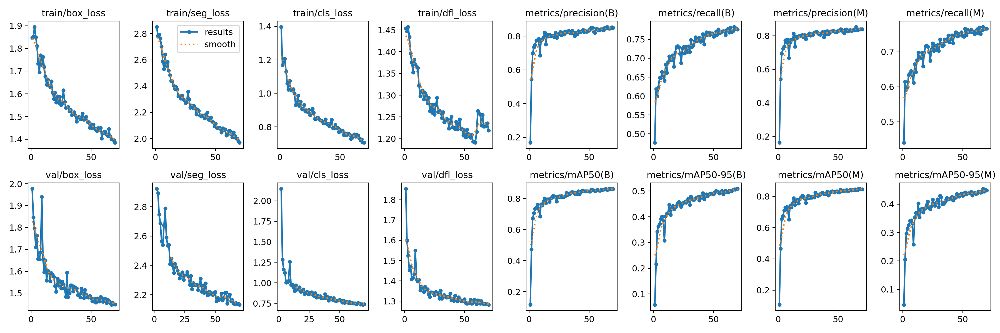

In [19]:
Image("yolov9_dataset/results/70_epochs-/results.png")

## Inference

In [3]:
inference_model = YOLO('yolov9_dataset/results/70_epochs-/weights/best.pt')


image 1/1 /v9e_workspace/yolov9_dataset/val/images/human_bladder_03.png: 640x640 13 Nucleis, 29.0ms
Speed: 2.5ms preprocess, 29.0ms inference, 5.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict


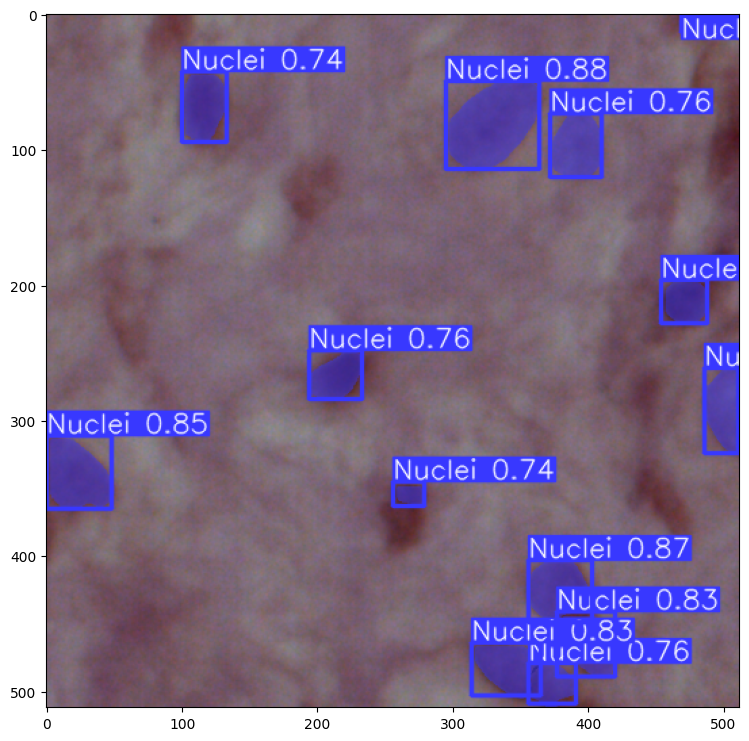

In [21]:
inference_img_path = "yolov9_dataset/val/images/human_bladder_03.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /v9e_workspace/yolov9_dataset/val/images/human_cerebellum_6.png: 640x640 55 Nucleis, 29.3ms
Speed: 10.0ms preprocess, 29.3ms inference, 5.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict


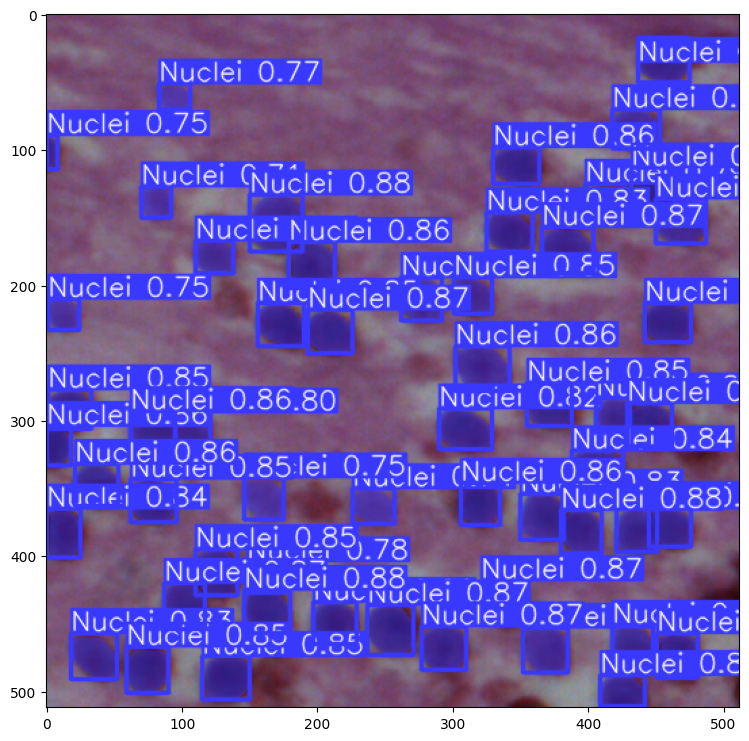

In [22]:
inference_img_path = "yolov9_dataset/val/images/human_cerebellum_6.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /v9e_workspace/yolov9_dataset/val/images/human_epiglottis_4.png: 640x640 5 Nucleis, 30.3ms
Speed: 10.2ms preprocess, 30.3ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


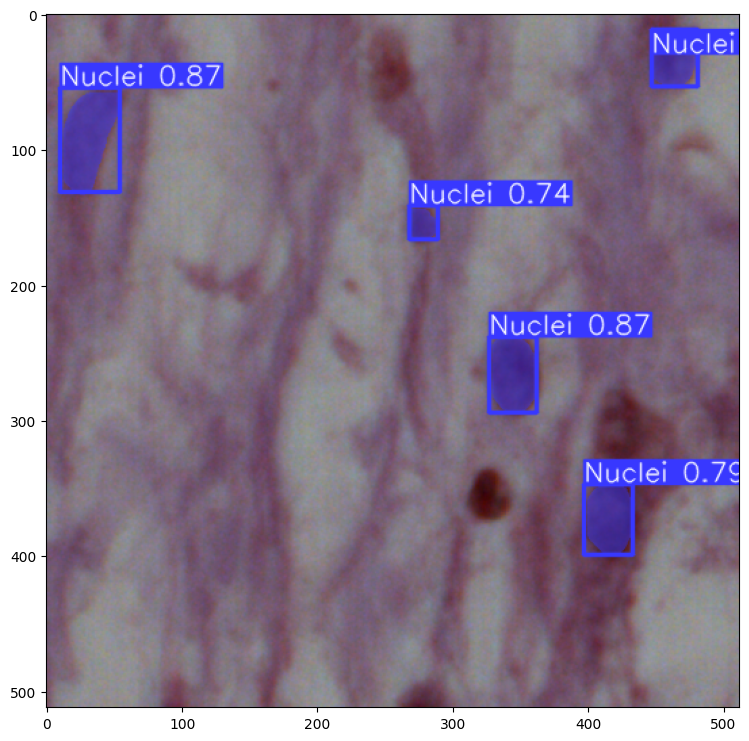

In [23]:
inference_img_path = "yolov9_dataset/val/images/human_epiglottis_4.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /v9e_workspace/yolov9_dataset/val/images/human_jejunum_02.png: 640x640 42 Nucleis, 31.5ms
Speed: 31.7ms preprocess, 31.5ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 640)


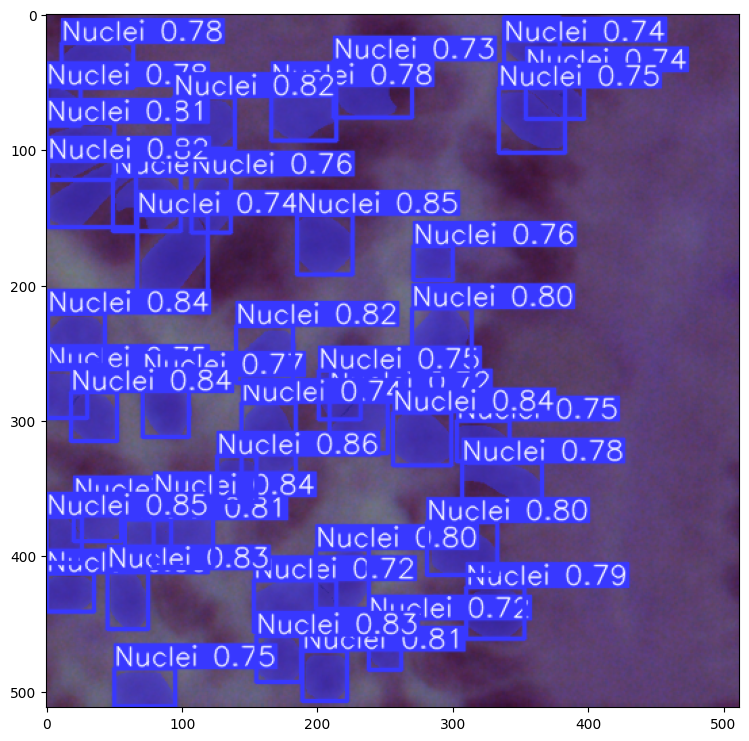

In [24]:
inference_img_path = "yolov9_dataset/val/images/human_jejunum_02.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /v9e_workspace/yolov9_dataset/val/images/human_kidney_01.png: 640x640 55 Nucleis, 29.2ms
Speed: 2.3ms preprocess, 29.2ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)


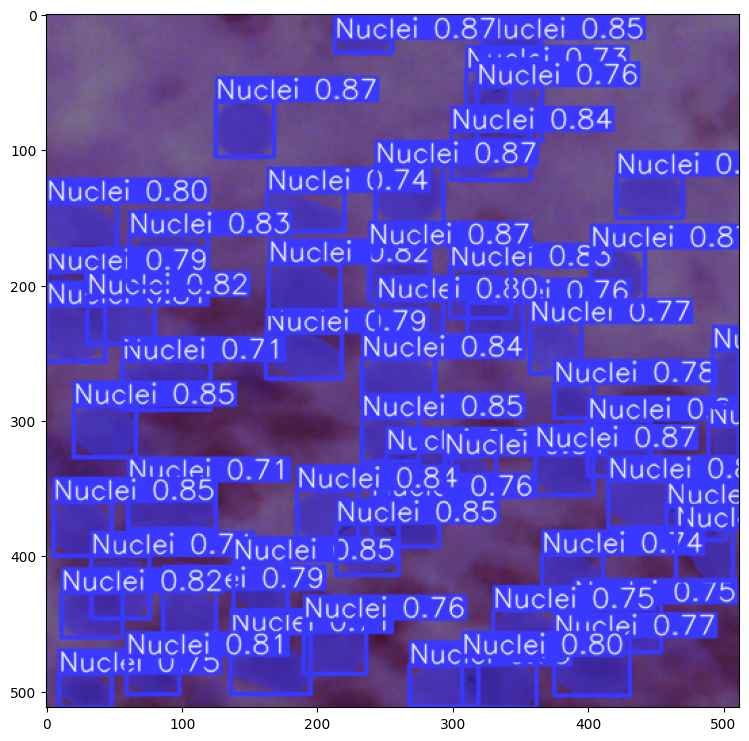

In [25]:
inference_img_path = "yolov9_dataset/val/images/human_kidney_01.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-640/v9e_workspace/9e_workspace/yolov9_dataset/val/images/human_liver_22.png: 640x640 30 Nucleis, 130.0ms
Speed: 5.0ms preprocess, 130.0ms inference, 8.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict6


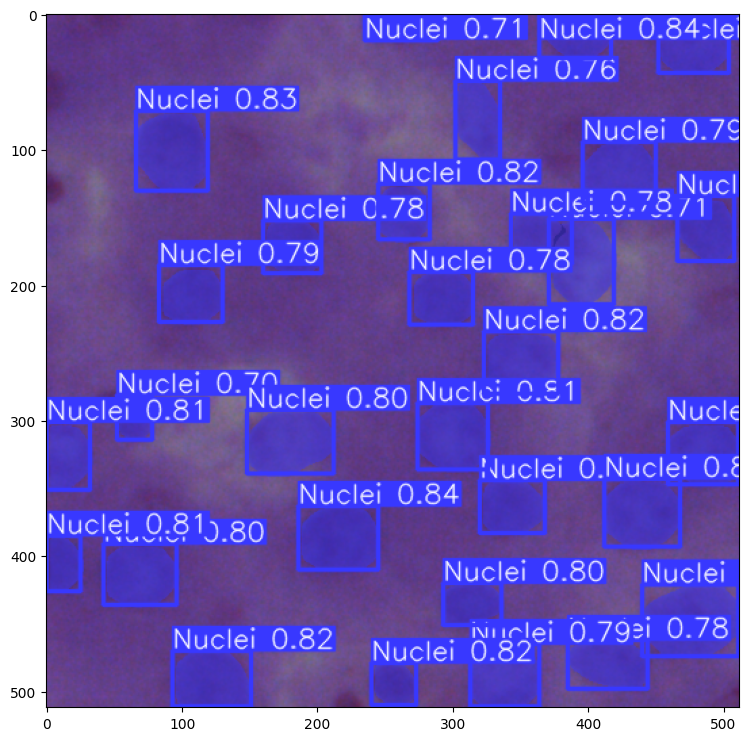

In [4]:
inference_img_path = "yolov9_dataset/val/images/human_liver_22.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-640/v9e_workspace/9e_workspace/yolov9_dataset/val/images/human_melanoma_03.png: 640x640 15 Nucleis, 137.5ms
Speed: 3.7ms preprocess, 137.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict6


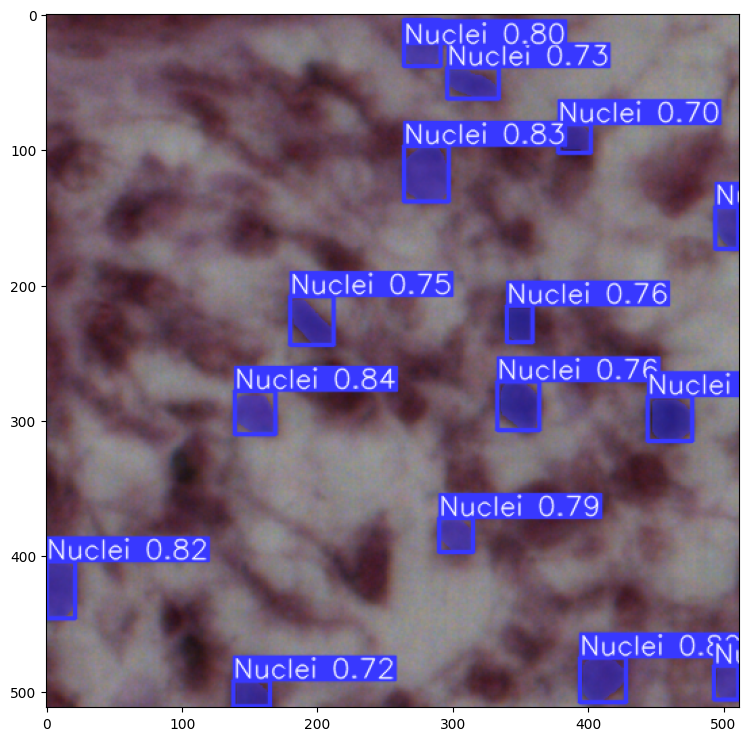

In [5]:
inference_img_path = "yolov9_dataset/val/images/human_melanoma_03.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-640/v9e_workspace/9e_workspace/yolov9_dataset/val/images/human_pancreas_11.png: 640x640 34 Nucleis, 125.5ms
Speed: 5.0ms preprocess, 125.5ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict6


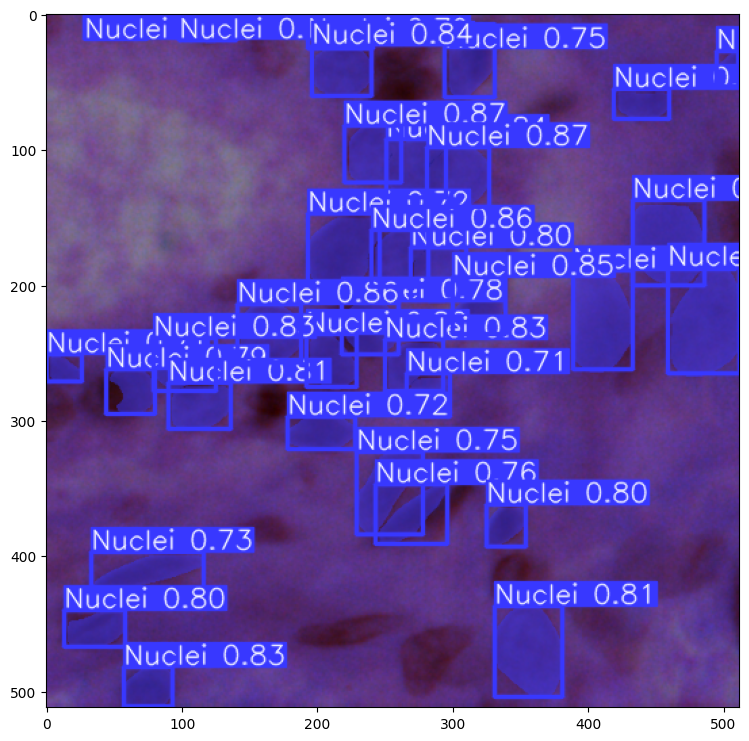

In [6]:
inference_img_path = "yolov9_dataset/val/images/human_pancreas_11.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-640/v9e_workspace/9e_workspace/yolov9_dataset/val/images/human_peritoneum_3.png: 640x640 13 Nucleis, 124.7ms
Speed: 2.0ms preprocess, 124.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict6


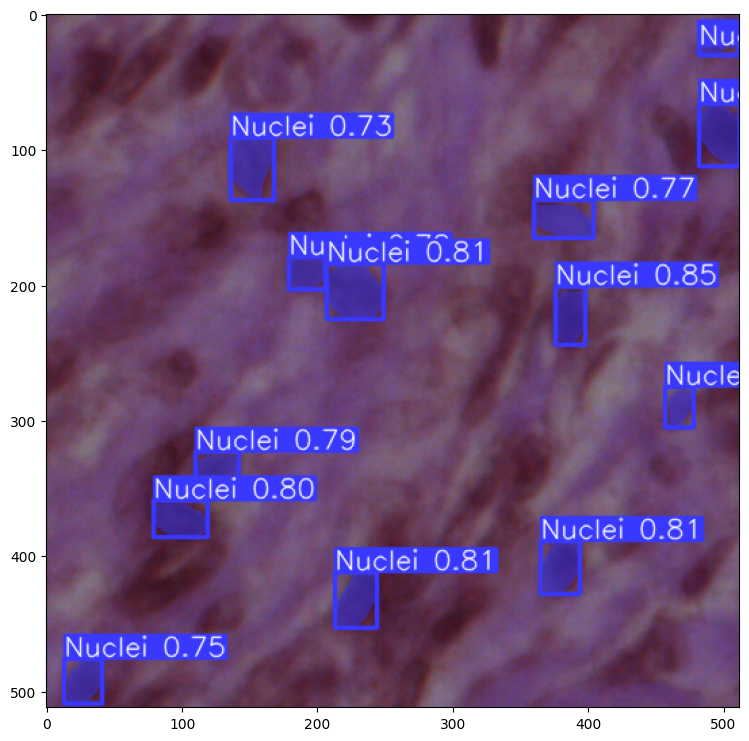

In [7]:
inference_img_path = "yolov9_dataset/val/images/human_peritoneum_3.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()

In [9]:
from google.colab import drive
drive.mount('/content/drive')

In [32]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [39]:
import shutil

# Define the paths
source_dir = '/content/yolov9_dataset'
destination_dir = '/content/drive/MyDrive/Yolov9e_exp'

# Copy the directory to Google Drive
shutil.copytree(source_dir, destination_dir)


'/content/drive/MyDrive/Yolov9e_exp'